Taken in part from the course [Creative applications of deep learning with tensorflow](https://www.kadenze.com/courses/creative-applications-of-deep-learning-with-tensorflow-i)

- [Painting an image](#paint-image)
  - [A function to define a single layer](#define-layer)
  - [Create deep network](#create-deep-network)
  - [Define a cost function](#cost-function)
  - [Train the network](#train-the-network)

In [1]:
# imports
%matplotlib inline
# %pylab osx
import os
import tensorflow as tf
import numpy as np

from scipy.misc import imresize
from PIL import Image

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
plt.style.use('ggplot')

# Bit of formatting because I don't like the default inline code style:
from IPython.core.display import HTML
HTML("""<style> .rendered_html code { 
    padding: 2px 4px;
    color: #c7254e;
    background-color: #f9f2f4;
    border-radius: 4px;
} </style>""")

<a name="paint-image"></a> 
## Painting and image

(65536, 2) (65536, 3)


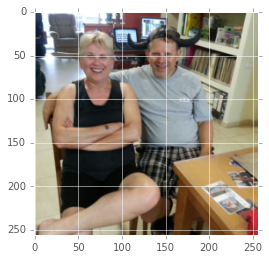

In [60]:
def crop_square(img):
    if img.shape[0] > img.shape[1]:
        extra = (img.shape[0] - img.shape[1])
        if extra % 2 == 0:
            crop = img[extra // 2:-extra // 2, :]
        else:
            crop = img[max(0, extra // 2 - 1):min(-1, -extra // 2), :]
    elif img.shape[1] > img.shape[0]:
        extra = (img.shape[1] - img.shape[0])
        if extra % 2 == 0:
            crop = img[:, extra // 2:-extra // 2]
        else:
            crop = img[:, max(0, extra // 2 - 1):min(-1, -extra // 2)]
    else:
        crop = img
    return crop

def crop_center(img, new_height, new_width):
   width =  np.size(img,1)
   height =  np.size(img,0)

   left = np.ceil((width - new_width)/2.)
   top = np.ceil((height - new_height)/2.)
   right = np.floor((width + new_width)/2.)
   bottom = np.floor((height + new_height)/2.)
   cImg = img[top:bottom, left:right]
   return cImg


image_files  = ['./images/20130712_190436_1.jpg','./images/20140108_162814.jpg']
img_orig     = [plt.imread(im) for im in image_files] 
img_cropped  = [crop_square(im) for im in img_orig]
imgs_resized = [imresize(im, (256, 256)) for im in img_cropped]

background   = Image.fromarray(imgs_resized[0])
overlay      = Image.fromarray(imgs_resized[1])

background   = background.convert("RGBA")
overlay      = overlay.convert("RGBA")
blended      = Image.blend(background, overlay, 0.65).convert("RGB")
img          = np.asarray(blended)

img          = imgs_resized[0]
plt.imshow(img)

# xs: pixel coordinates, ys: RGB values
xs = []
ys = []
getting_data = [1,1]
for row_i in range(img.shape[0]):
    for col_i in range(img.shape[1]):
        xs.append([row_i, col_i])
        ys.append(img[row_i, col_i])

xs = np.array(xs)
ys = np.array(ys)

xs = (xs - np.mean(xs)) / np.std(xs)

print xs.shape, ys.shape

<a name="define-layer"></a> 
## Define a single layer in tensorflow
A single layer consists of linear unit plus and activation function. The W values are initialized using random values drawn from a normal distribution while biases are initialized to zero. More on variables creation, initialization, saving and loading in [here](https://www.tensorflow.org/versions/r0.10/how_tos/variables/index.html)

In [3]:
# Define a single hidden layer with activation function
# Creating variables with scope (unique name) allows easy chaining of layers
def linear(X, n_input, n_output, activation, scope):
    with tf.variable_scope(scope):
        # Create/return variable with a given scope
        W = tf.get_variable(
            name='W',
            shape=[n_input, n_output],
            initializer=tf.random_normal_initializer(mean=0.0, stddev=0.1))
        b = tf.get_variable(
            name='b',
            shape=[n_output],
            initializer=tf.constant_initializer())
        h = tf.matmul(X, W) + b
        if activation is not None:
            h = activation(h)
        return h

<a name="create-deep-network"></a> 
## Create the deep network

By chaining together layers starting with the input (stream of (x,y) values) and ending with the output - corresponding stream of RGB values.

In [63]:
tf.reset_default_graph()
g  = tf.get_default_graph()

# in: 2 (x,y), out 
n_neurons = [2, 64, 64, 64, 64, 64, 64, 64, 3]

X = tf.placeholder(tf.float32, shape=[None, 2], name='X')
Y = tf.placeholder(tf.float32, shape=[None, 3], name='Y')

current_input = X
for layer_i in range(1, len(n_neurons)):
    current_input = linear(
        X=current_input,
        n_input=n_neurons[layer_i - 1],
        n_output=n_neurons[layer_i],
        activation=tf.nn.relu if (layer_i+1) < len(n_neurons) else None,
        scope='layer_' + str(layer_i))
Y_pred = current_input

<a name="cost-function"></a> 
## Define a cost function

The cost function defined below is the average of the absolute difference between known RGB values (Y) and RGB values predicted by the network (Y_pred).

In [64]:
# L1 cost function
def distance_l1(p1, p2):
    return tf.abs(p1 - p2)
def distance_l2(p1, p2):
    return tf.pow(p1 - p2,2)

distance  = distance_l2
cost      = tf.reduce_mean(tf.reduce_sum(distance(Y_pred, Y), 1))  # cost: maen of sum of absolute values of RGB 

print Y.get_shape(),Y_pred.get_shape(),tf.reduce_sum(distance(Y_pred, Y), 1).get_shape(),cost.get_shape()


(?, 3) (?, 3) (?,) ()


<a name="train-the-network"></a> 
## Train

Using specifig number of iterations, batch size and learning rate

Iteration: 0 , cost: 9433.05078125


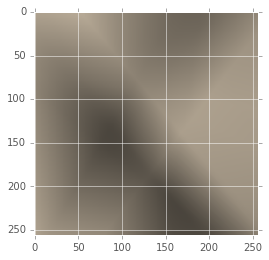

Iteration: 1 , cost: 7725.79785156


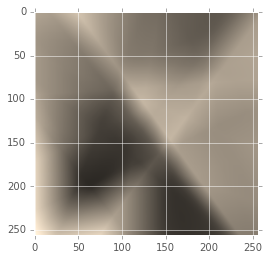

Iteration: 2 , cost: 7010.34375


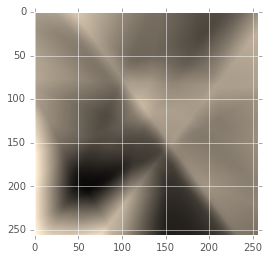

Iteration: 3 , cost: 6417.06054688


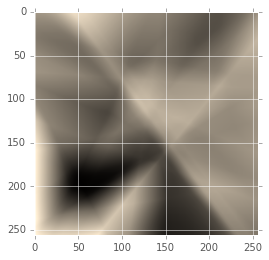

Iteration: 4 , cost: 6143.23583984


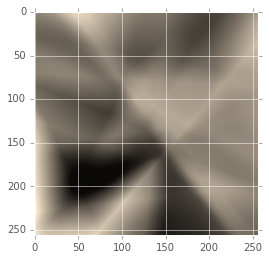

Iteration: 5 , cost: 6074.25537109


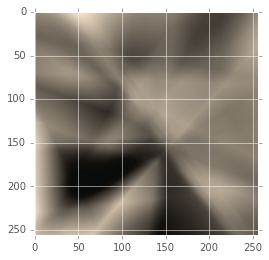

Iteration: 6 , cost: 5425.47558594


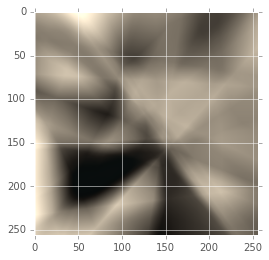

Iteration: 7 , cost: 5275.65917969


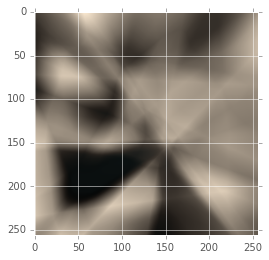

Iteration: 8 , cost: 4952.15136719


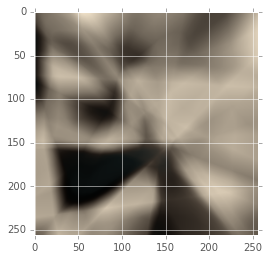

Iteration: 9 , cost: 4203.64257812


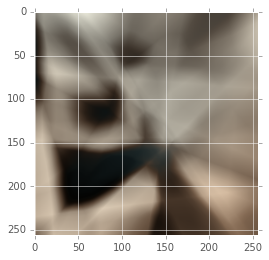

Iteration: 10 , cost: 4077.52587891


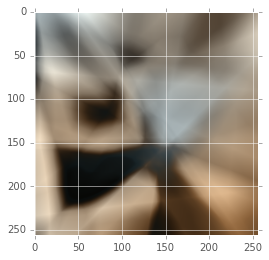

Iteration: 11 , cost: 3860.03222656


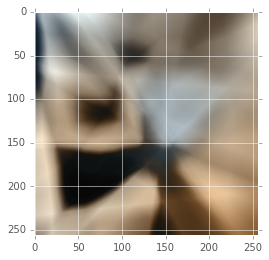

Iteration: 12 , cost: 3683.48681641


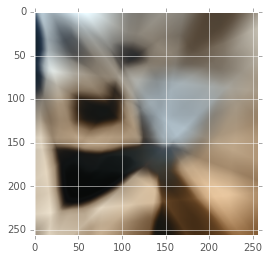

Iteration: 13 , cost: 3569.01660156


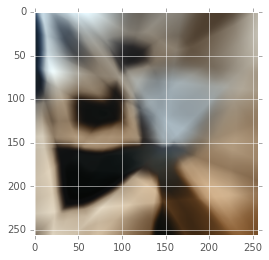

Iteration: 14 , cost: 3458.77294922


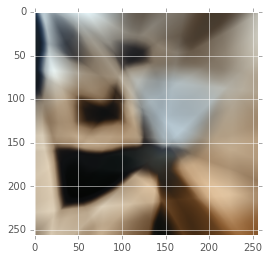

Iteration: 15 , cost: 3397.55493164


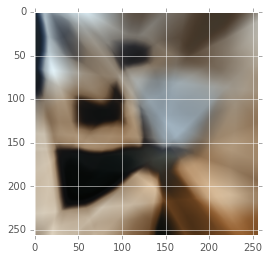

Iteration: 17 , cost: 3160.74267578


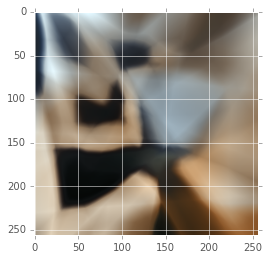

Iteration: 21 , cost: 2980.12158203


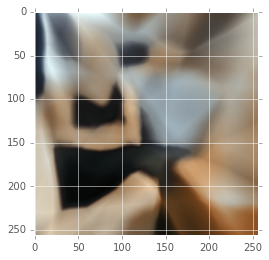

Iteration: 24 , cost: 2712.12524414


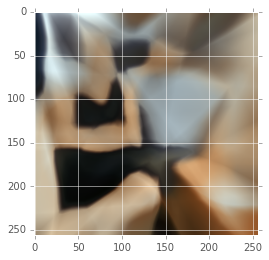

Iteration: 30 , cost: 2707.38891602


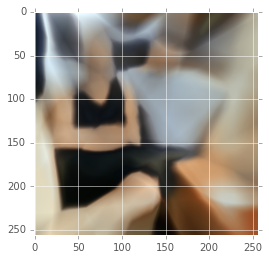

Iteration: 31 , cost: 2691.64990234


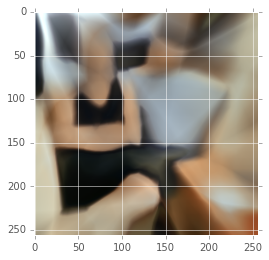

Iteration: 32 , cost: 2691.21801758


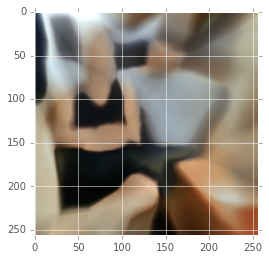

Iteration: 33 , cost: 2478.07128906


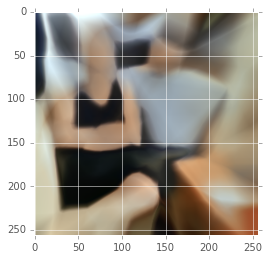

Iteration: 35 , cost: 2466.18457031


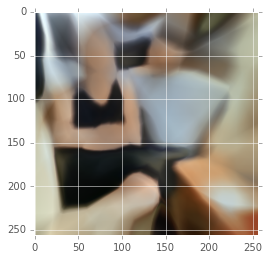

Iteration: 39 , cost: 2410.87402344


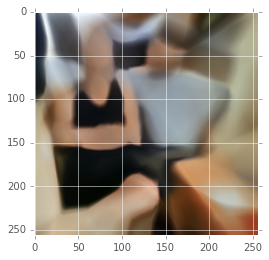

Iteration: 41 , cost: 2298.60473633


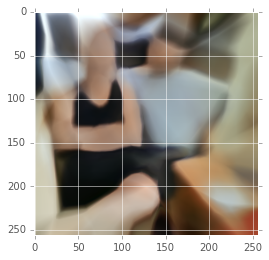

Iteration: 42 , cost: 2224.61987305


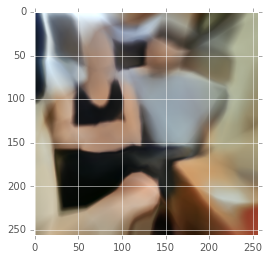

Iteration: 45 , cost: 2020.94970703


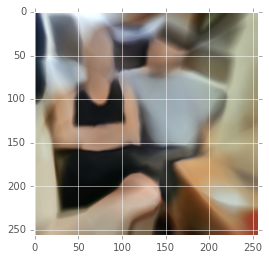

Iteration: 49
Iteration: 51 , cost: 2019.1072998


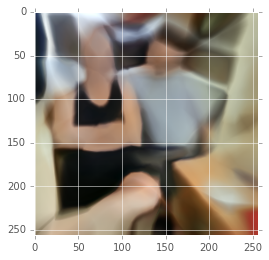

Iteration: 52 , cost: 1969.71118164


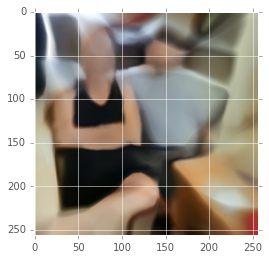

Iteration: 53 , cost: 1945.17773438


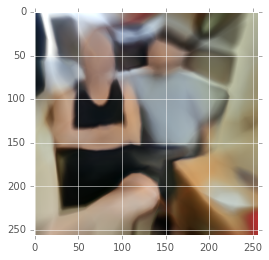

Iteration: 54 , cost: 1891.16064453


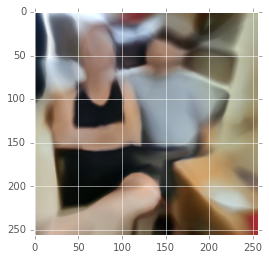

Iteration: 59 , cost: 1866.71789551


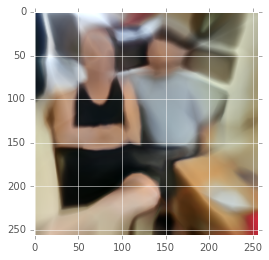

Iteration: 62 , cost: 1824.35302734


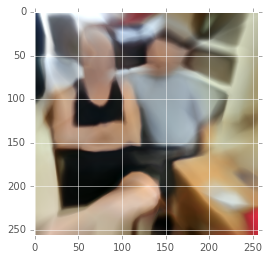

Iteration: 66 , cost: 1640.78015137


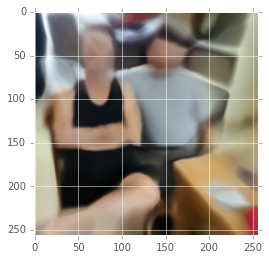

Iteration: 72 , cost: 1570.84667969


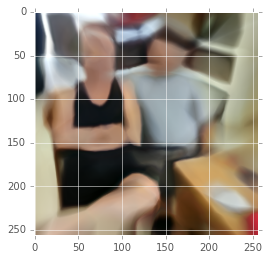

Iteration: 76 , cost: 1543.79760742


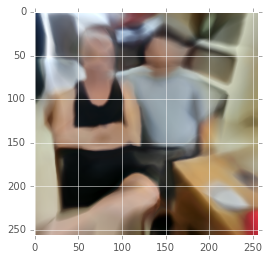

Iteration: 81 , cost: 1522.97412109


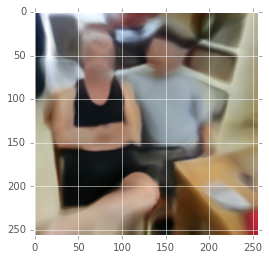

Iteration: 86 , cost: 1465.02490234


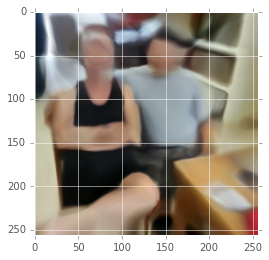

Iteration: 89 , cost: 1364.99853516


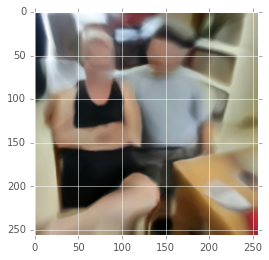

Iteration: 99
Iteration: 100 , cost: 1350.84179688


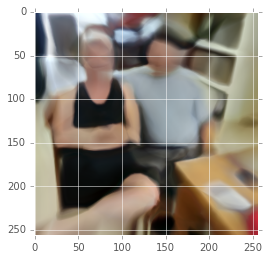

Iteration: 102 , cost: 1348.60693359


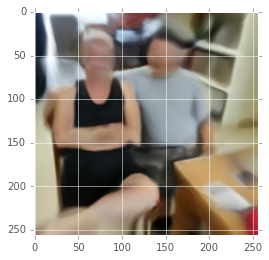

Iteration: 104 , cost: 1314.95019531


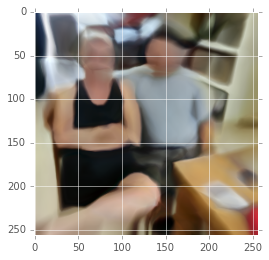

Iteration: 105 , cost: 1236.04052734


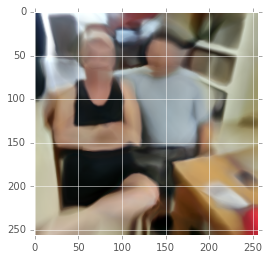

Iteration: 111 , cost: 1235.70751953


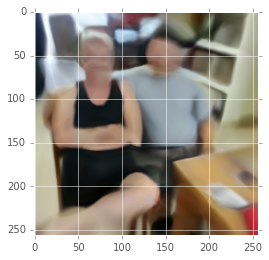

Iteration: 122 , cost: 1192.68786621


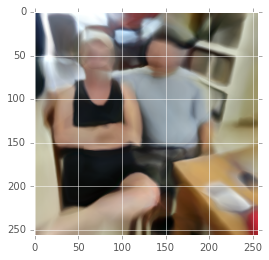

Iteration: 126 , cost: 1123.3560791


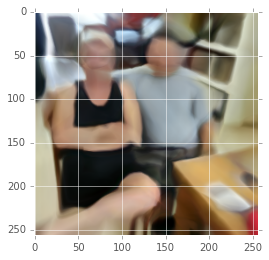

Iteration: 142 , cost: 1088.59057617


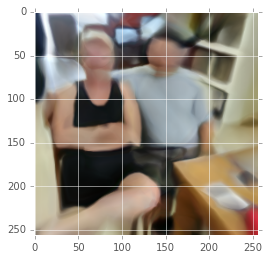

Iteration: 146 , cost: 1043.55444336


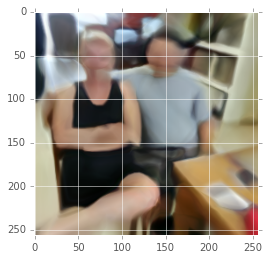

Iteration: 149
Iteration: 150 , cost: 1021.93817139


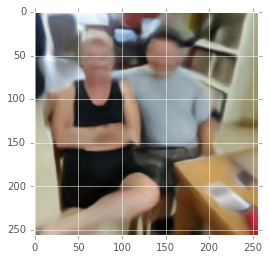

Iteration: 151 , cost: 992.083251953


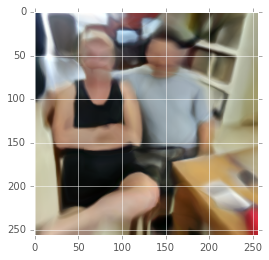

Iteration: 168 , cost: 965.633544922


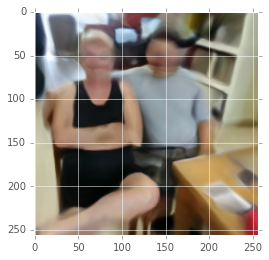

Iteration: 172 , cost: 960.784362793


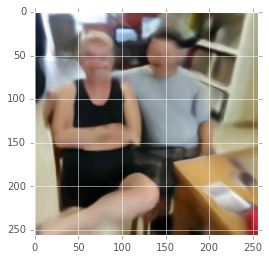

Iteration: 174 , cost: 912.067443848


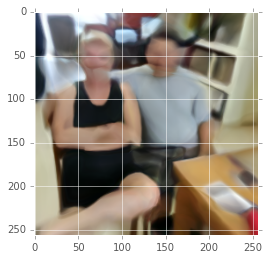

Iteration: 182 , cost: 884.205322266


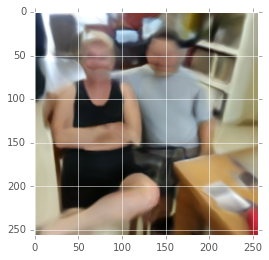

Iteration: 189 , cost: 875.991821289


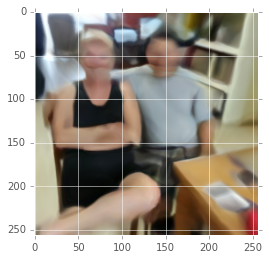

Iteration: 194 , cost: 849.144287109


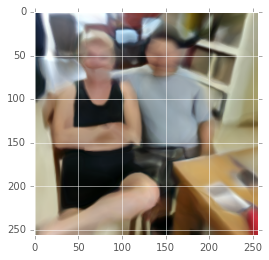

Iteration: 199
Iteration: 209 , cost: 837.662597656


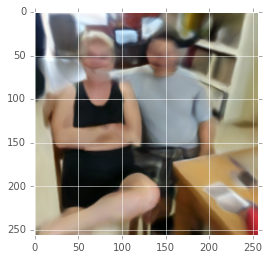

Iteration: 214 , cost: 800.198547363


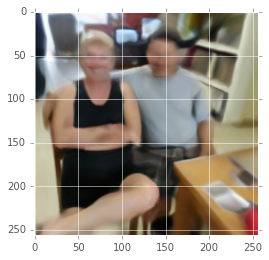

Iteration: 219 , cost: 764.344848633


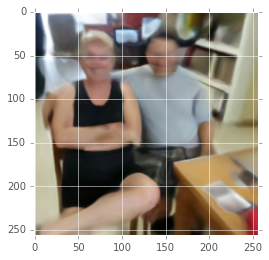

Iteration: 241 , cost: 755.737243652


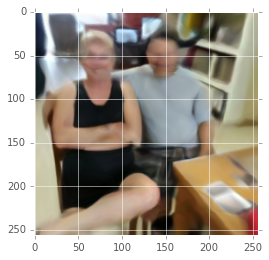

Iteration: 246 , cost: 749.155883789


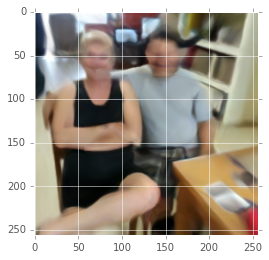

Iteration: 249
Iteration: 269 , cost: 728.010009766


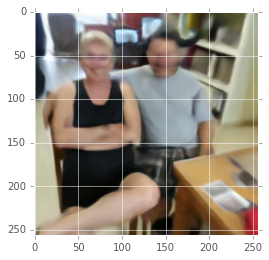

Iteration: 279 , cost: 720.468505859


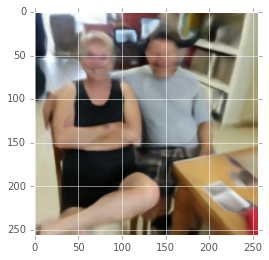

Iteration: 283 , cost: 698.329406738


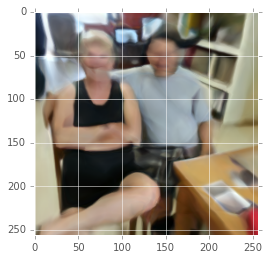

Iteration: 295 , cost: 661.67199707


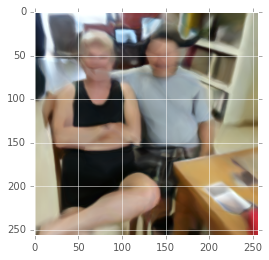

Iteration: 299
Iteration: 313 , cost: 638.033935547


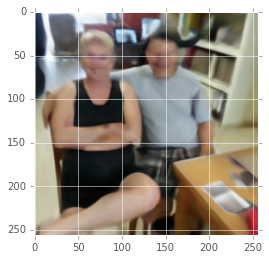

Iteration: 326 , cost: 621.104187012


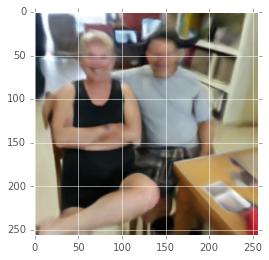

Iteration: 332 , cost: 610.494934082


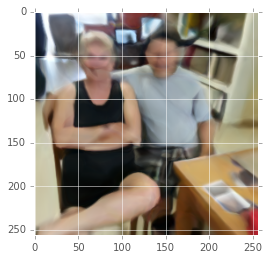

Iteration: 349
Iteration: 375 , cost: 579.322937012


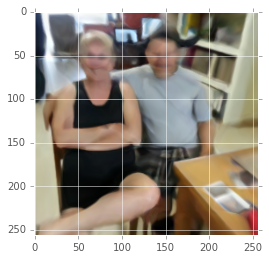

Iteration: 379 , cost: 550.346191406


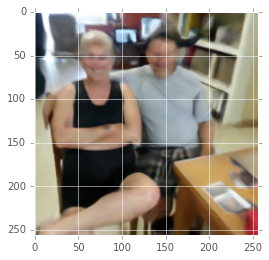

Iteration: 399
Iteration: 418 , cost: 536.435668945


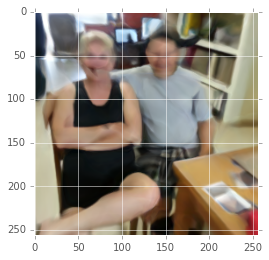

Iteration: 449
Iteration: 451 , cost: 492.25970459


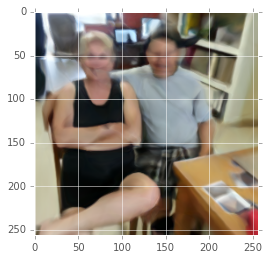

Iteration: 492 , cost: 483.128845215


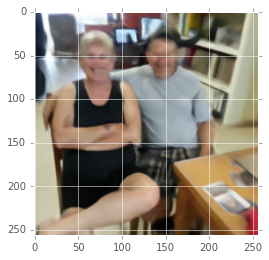

Iteration: 499
Iteration: 504 , cost: 472.895385742


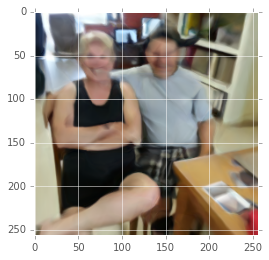

Iteration: 544 , cost: 467.034606934


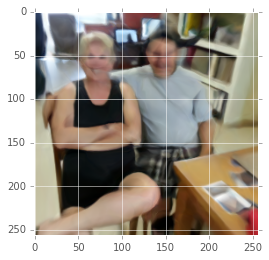

Iteration: 549
Iteration: 564 , cost: 463.396606445


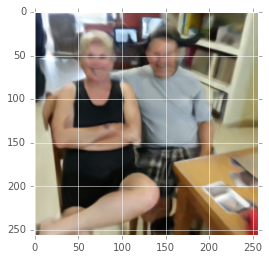

Iteration: 582 , cost: 437.827514648


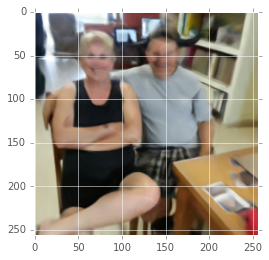

Iteration: 599
Iteration: 611 , cost: 427.849761963


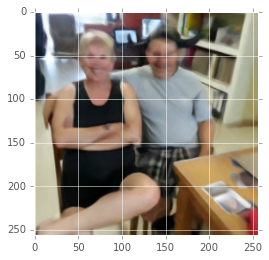

Iteration: 615 , cost: 421.647186279


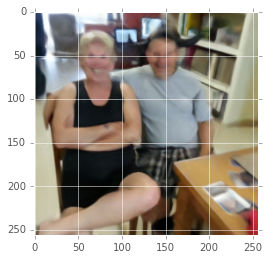

Iteration: 649
Iteration: 661 , cost: 418.716247559


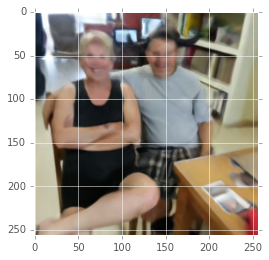

Iteration: 681 , cost: 408.55480957


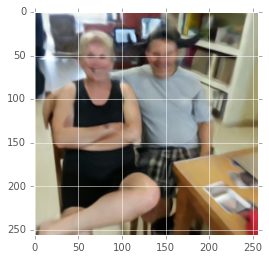

Iteration: 699
Iteration: 716 , cost: 400.641998291


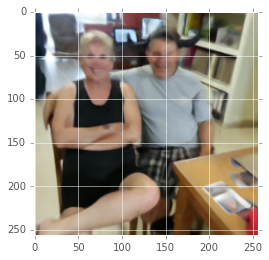

Iteration: 741 , cost: 380.023529053


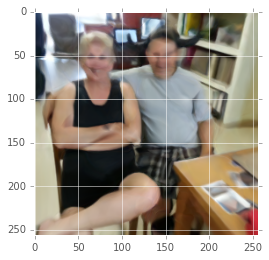

Iteration: 749
Iteration: 768 , cost: 344.609924316


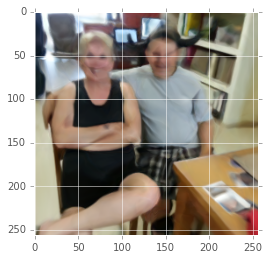

Iteration: 799
Iteration: 849
Iteration: 872 , cost: 342.99710083


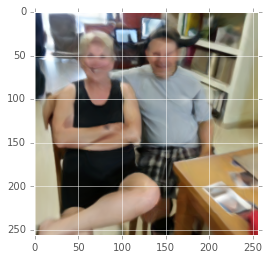

Iteration: 899
Iteration: 931 , cost: 340.358337402


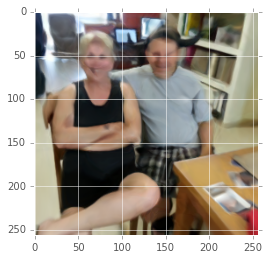

Iteration: 944 , cost: 334.484741211


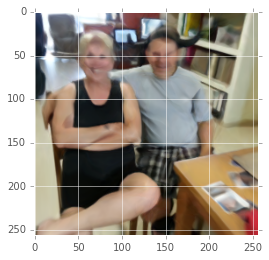

Iteration: 949
Iteration: 958 , cost: 325.192230225


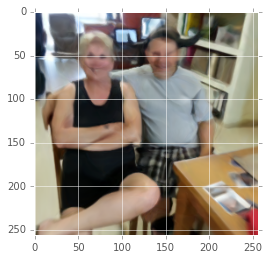

Iteration: 999
Iteration: 1007 , cost: 319.941741943


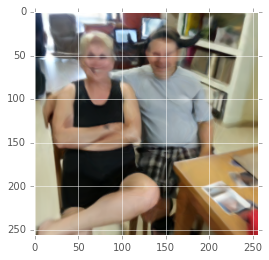

Iteration: 1028 , cost: 308.405883789


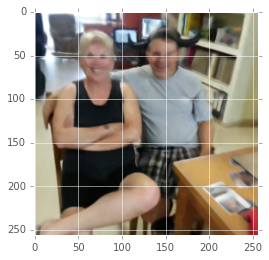

Iteration: 1049
Iteration: 1055 , cost: 299.993469238


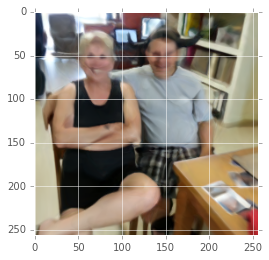

Iteration: 1078 , cost: 297.924957275


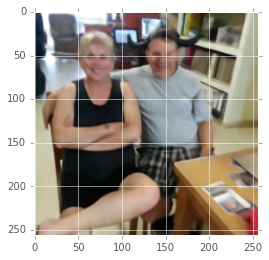

Iteration: 1099
Iteration: 1111 , cost: 296.130615234


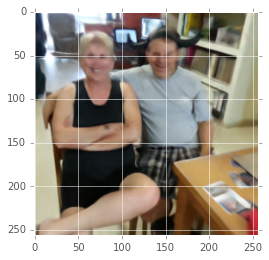

Iteration: 1149
Iteration: 1188 , cost: 294.543273926


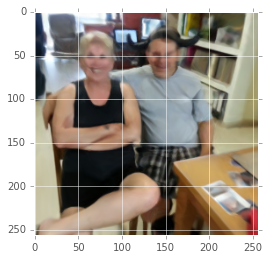

Iteration: 1192 , cost: 269.355285645


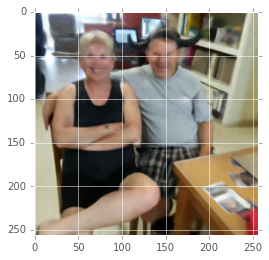

Iteration: 1199
Iteration: 1210 , cost: 256.971984863


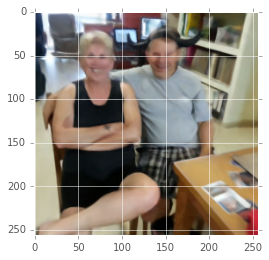

Iteration: 1249
Iteration: 1299
Iteration: 1312 , cost: 255.963485718


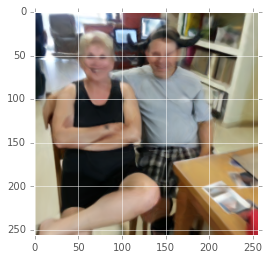

Iteration: 1349
Iteration: 1399
Iteration: 1416 , cost: 249.577957153


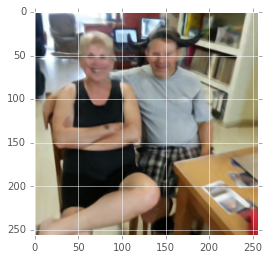

Iteration: 1449
Iteration: 1460 , cost: 244.057495117


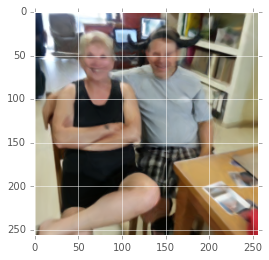

Iteration: 1499
Iteration: 1506 , cost: 233.975402832


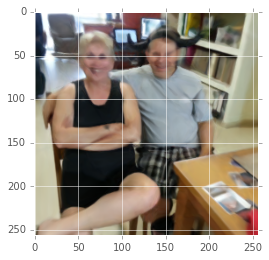

Iteration: 1549
Iteration: 1599
Iteration: 1649
Iteration: 1681 , cost: 226.933547974


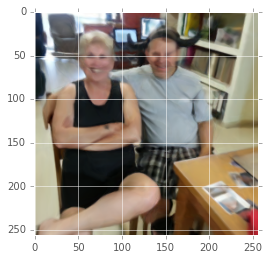

Iteration: 1699
Iteration: 1723 , cost: 223.755096436


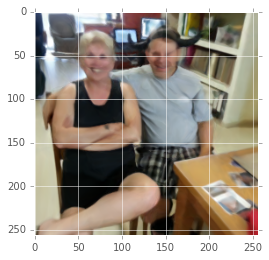

Iteration: 1740 , cost: 222.480178833


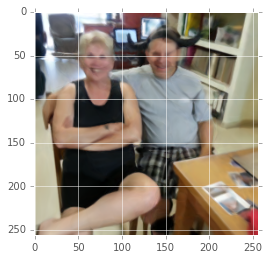

Iteration: 1749
Iteration: 1799
Iteration: 1837 , cost: 210.982284546


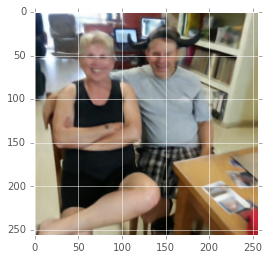

Iteration: 1849
Iteration: 1899
Iteration: 1949
Iteration: 1999 , cost: 202.750061035


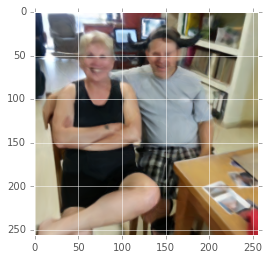

Iteration: 1999


In [66]:
n_iterations  = 2000
batch_size    = 50
learning_rate = 0.0005

imgs          = []
costs         = []
gif_step      = 50

optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cost)
with tf.Session() as sess:
    # Initialize all tf variables using specified initializers
    sess.run(tf.initialize_all_variables())

    # We now run a loop over epochs
    prev_training_cost = -1.0
    for it_i in range(n_iterations):
        idxs = np.random.permutation(range(len(xs)))
        n_batches = len(idxs) // batch_size
        for batch_i in range(n_batches):
            idxs_i = idxs[batch_i * batch_size: (batch_i + 1) * batch_size]
            sess.run( optimizer, 
                     feed_dict={X: xs[idxs_i], Y: ys[idxs_i]})

        training_cost = sess.run(cost, feed_dict={X: xs, Y: ys})

        store_img = False   
        if prev_training_cost < 0.0 or training_cost < prev_training_cost:
            print 'Iteration: {} , cost: {}'.format(it_i, training_cost)
            store_img = True
            ys_pred   = Y_pred.eval(feed_dict={X: xs}, session=sess)
            img       = np.clip(ys_pred.reshape(img.shape), 0, 255).astype(np.uint8)
            imgs.append(img)
            plt.imshow(img)
            plt.show()
            prev_training_cost = training_cost

        if (it_i + 1) % gif_step == 0:
            print 'Iteration: {}'.format(it_i)

<a name="make-clip"></a> 
## Make a video clip


In [67]:
import moviepy.editor as mpy
i = -1

class MakeClip():
    def __init__(self,imgs):
        self.imgs = imgs
        self.i    = -1

    def make_frame(self,t):
        print ' t= ',t
        self.i += 1
        if self.i >= len(self.imgs):
            self.i = 0
        return self.imgs[self.i]

print 'N images in clip: ',len(imgs)
make_clip = MakeClip(imgs)
clip1      = mpy.VideoClip(make_clip.make_frame, duration=2) # 2 seconds
clip1.write_gif("my1.gif",fps=25)


clip2 = mpy.ImageSequenceClip(imgs, fps=100)
clip2.write_gif("my2.gif")


N images in clip:  106
 t=  0

[MoviePy] Building file my1.gif with imageio


 41%|████      | 21/51 [00:00<00:00, 207.74it/s]

 t=  0.0
 t=  0.04
 t=  0.08
 t=  0.12
 t=  0.16
 t=  0.2
 t=  0.24
 t=  0.28
 t=  0.32
 t=  0.36
 t=  0.4
 t=  0.44
 t=  0.48
 t=  0.52
 t=  0.56
 t=  0.6
 t=  0.64
 t=  0.68
 t=  0.72
 t=  0.76
 t=  0.8
 t=  0.84
 t=  0.88
 t=  0.92
 t=  0.96
 t=  1.0
 t=  1.04
 t=  1.08
 t=  1.12
 t=  1.16
 t=  1.2
 t=  1.24
 t=  1.28
 t=  1.32
 t=  1.36
 t=  1.4
 t=  1.44
 t=  1.48
 t=  1.52
 t=  1.56
 t=  1.6
 t=  1.64
 t=  1.68
 t=  1.72


 98%|█████████▊| 50/51 [00:00<00:00, 209.96it/s]


 t=  1.76
 t=  1.8
 t=  1.84
 t=  1.88
 t=  1.92
 t=  1.96

[MoviePy] Building file my2.gif with imageio


100%|██████████| 107/107 [00:00<00:00, 228.98it/s]
